In [1]:
import os
import sys
sys.path.append("/home/dux/")
sys.path.append("/home/dux/surface_sampling/sgmc_surf")

from ase.calculators.lammpsrun import LAMMPS
from ase.io import read
from ase.build import make_supercell
from catkit.gen.adsorption import get_adsorption_sites

import catkit
import numpy as np

from mcmc import mcmc_run, slab_energy

from htvs.djangochem.pgmols.utils import surfaces

In [2]:
# Get pristine surface
# GaN 0001 surface
atoms = read('GaN_hexagonal.cif')

# supercell_atoms = atoms*(2,2,2)
# supercell_atoms.write('GaN_hexagonal_2x2.cif')

supercell_atoms = atoms*(3,3,3)
supercell_atoms.write('GaN_hexagonal_3x3.cif')

slab, surface_atoms = surfaces.surface_from_bulk(supercell_atoms, [0,0,0,-1], size=[3,3], vacuum=10)

# set surface atoms from the other side
all_atoms = np.arange(len(slab))
curr_surf_atoms = slab.get_surface_atoms()
new_surf_atoms = np.setdiff1d(all_atoms, curr_surf_atoms)
slab.set_surface_atoms(new_surf_atoms)
# invert the positions
slab.set_scaled_positions(1 - slab.get_scaled_positions())

# slab.write('GaN_0001_2x2_pristine_slab.cif')
slab.write('GaN_0001_3x3_pristine_slab.cif')

/home/dux/miniconda3/envs/mlenv/lib/python3.8/site-packages/catkit/gen/surface.py:334: UserWarning: Your slab has no bulk atoms and may be too thin to identify surface atoms correctly. This may cause surface adsorption site identification to fail.
  warnings.warn(


In [3]:
# try 2003 tersoff potential 
parameters = {
    'pair_style': 'tersoff',
    'pair_coeff': ['* * GaN.tersoff Ga N']
}
potential_file = os.path.join(os.environ["LAMMPS_POTENTIALS"], 'GaN.tersoff')
lammps_calc = LAMMPS(files=[potential_file], keep_tmp_files=False, keep_alive=False, tmp_dir="/home/dux/surface_sampling/tmp_files")
lammps_calc.set(**parameters)

{'pair_style': 'tersoff', 'pair_coeff': ['* * GaN.tersoff Ga N']}

In [4]:
element = 'Ga'
ads = catkit.gratoms.Gratoms(element)

In [5]:
def start_iter(slab, stat_len, output_template, start_iter=0, max_iter = 10, alpha=1e-3):
    curr_iter = start_iter
    while curr_iter < max_iter:
        print(f"curr slab energy {slab_energy(slab)}")
        all_forces = slab.get_forces()
        # print(f"max force {np.max(np.abs(all_forces))}")
        rel_forces = all_forces[stat_len:]
        all_pos = slab.get_positions()
        rel_pos = all_pos[stat_len:]
        rel_pos += alpha*rel_forces
        all_pos[stat_len:] = rel_pos
        slab.set_positions(all_pos)
        curr_iter += 1
        slab.write(output_template.format(curr_iter))

In [6]:
# starting from more random initial positions
num_ads_atoms = 12 # needs to have so many atoms

slab, surface_atoms = surfaces.surface_from_bulk(supercell_atoms, [0,0,0,-1], size=[3,3], vacuum=10)
# get initial adsorption sites
proper_adsorbed = read("GaN_0001_3x3_12_Ga_ads_initial_slab.cif")
ads_positions = proper_adsorbed.get_positions()[len(slab):]
assert len(ads_positions) == num_ads_atoms, "num of adsorption sites does not match num ads atoms"

curr_iter = 0
max_iter = 10

proper_adsorbed.calc = lammps_calc
stat_len = len(slab)

start_iter(proper_adsorbed, stat_len, output_template="GaN_0001_3x3_12_Ga_ads_iter{:02d}_slab.cif", max_iter=max_iter)

curr slab energy -135.010946560906
curr slab energy -135.7778421586212
curr slab energy -136.5656120202013
curr slab energy -137.380820013302
curr slab energy -138.2297848189093
curr slab energy -139.1181249079737
curr slab energy -140.0501204409404
curr slab energy -141.0298881821365
curr slab energy -142.0687360864555
curr slab energy -143.1717323778875


In [7]:
# manually get the atoms into *correct* positions
# proper_adsorbed.get_positions()
arranged_slab = read("GaN_0001_3x3_12_Ga_ads_arranged_slab.cif")
arranged_slab.calc = lammps_calc

slab_energy(arranged_slab)

-174.1774576888824

In [8]:
from ase.optimize import BFGS
from ase.constraints import FixAtoms

num_bulk_atoms = len(slab)
bulk_indices = list(range(num_bulk_atoms))
print(f"bulk indices {bulk_indices}")
c = FixAtoms(indices=bulk_indices)
arranged_slab.set_constraint(c)

# make bulk atoms don't move
copied_slab = arranged_slab.copy()
copied_slab.calc = lammps_calc

dyn = BFGS(copied_slab)
dyn.run(fmax=0.05)
BFGS_optim_file = "GaN_0001_3x3_12_Ga_ads_BFGS_optim_arranged_slab.cif"
dyn.atoms.write(BFGS_optim_file)

copied_slab.write("GaN_0001_3x3_12_Ga_ads_original_optim_arranged_slab.cif")
# copied slab looks the same, 

bulk indices [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
      Step     Time          Energy         fmax
BFGS:    0 17:23:55     -174.177458        3.4785
BFGS:    1 17:23:55     -175.981365        4.4040
BFGS:    2 17:23:55     -179.517607        3.9735
BFGS:    3 17:23:55     -179.922619        2.9606
BFGS:    4 17:23:55     -180.483202        0.3381
BFGS:    5 17:23:55     -180.498811        0.2446
BFGS:    6 17:23:55     -180.518476        0.1344
BFGS:    7 17:23:55     -180.519468        0.1245
BFGS:    8 17:23:55     -180.523781        0.0309


In [9]:
optim_slab = read(BFGS_optim_file)
optim_slab.calc = lammps_calc
slab_energy(optim_slab)

-180.5237675050187

In [10]:
# try optimizing the arranged slab
# varying the learning rate
# ensure that movement for each iter isn't so huge
start_iter(arranged_slab, stat_len, output_template="GaN_0001_3x3_12_Ga_ads_iter{:02d}_arranged_slab.cif", max_iter=20, alpha=1e-2)

curr slab energy -174.1774576888824
curr slab energy -175.4000061941359
curr slab energy -177.0837776719652
curr slab energy -178.7684593127665
curr slab energy -179.9587292724641
curr slab energy -180.4046294989772
curr slab energy -180.4516271196322
curr slab energy -180.4726912768402
curr slab energy -180.4868311701726
curr slab energy -180.4966389467031
curr slab energy -180.5034918533292
curr slab energy -180.5083192180776
curr slab energy -180.5117571247418
curr slab energy -180.5142402758776
curr slab energy -180.5160649063447
curr slab energy -180.5174324002708
curr slab energy -180.5184794944115
curr slab energy -180.5192990841638
curr slab energy -180.5199544598769
curr slab energy -180.5204889811579


In [11]:
# canonical with relaxation
num_sweeps = 10
surface_name = "GaN_0001_3x3"
alpha = 0.99
slab, surface_atoms = surfaces.surface_from_bulk(supercell_atoms, [0,0,0,-1], size=[3,3], vacuum=10)
# set surface atoms from the other side
all_atoms = np.arange(len(slab))
curr_surf_atoms = slab.get_surface_atoms()
new_surf_atoms = np.setdiff1d(all_atoms, curr_surf_atoms)
slab.set_surface_atoms(new_surf_atoms)
# invert the positions
slab.set_scaled_positions(1 - slab.get_scaled_positions())

# try positive chem pot
chem_pot = 5
history, energy_hist, frac_accept_hist, adsorption_count_hist = mcmc_run(num_sweeps=num_sweeps, temp=1, pot=chem_pot, alpha=alpha, slab=slab, calc=lammps_calc, surface_name=surface_name, element=element, canonical=True, num_ads_atoms=num_ads_atoms, relax=True)

INFO:Running with num_sweeps = 10, temp = 1, pot = 5, alpha = 0.99
INFO:there are 36 atoms 
INFO:using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f488879b160>
/home/dux/miniconda3/envs/mlenv/lib/python3.8/site-packages/catkit/gen/adsorption.py:60: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.r1_topology = np.array(self.r1_topology)
/home/dux/miniconda3/envs/mlenv/lib/python3.8/site-packages/catkit/gen/adsorption.py:61: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.r2_topology = np.array(self.r2_topology)
INFO:In pristine slab

LAMMPS (29 Sep 2021)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  triclinic box = (0.0000000 0.0000000 0.0000000) to (9.6488702 8.3561667 23.265754) with tilt (4.8244351 0.0000000 0.0000000)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  37 atoms
  read_data CPU = 0.001 seconds
36 atoms in group bulk
Reading tersoff potential file /home/dux/surface_sampling/sgmc_surf/py_lammps/GaN.tersoff with DATE: 2007-10-22
Neighbor list info ...
  update every 1 steps, delay 0 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 5.1
  ghost atom cutoff = 5.1
  binsize = 2.55, bins = 6 4 10
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair tersoff, perpetual
      attributes: full, newton on
      pair build: full/b

INFO:running for 72 iterations per run over a total of 10 runs
INFO:adsorbate is Ga
INFO:In sweep 1 out of 10


LAMMPS (29 Sep 2021)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  triclinic box = (0.0000000 0.0000000 0.0000000) to (9.6488702 8.3561667 23.265754) with tilt (4.8244351 0.0000000 0.0000000)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  47 atoms
  read_data CPU = 0.001 seconds
36 atoms in group bulk
Reading tersoff potential file /home/dux/surface_sampling/sgmc_surf/py_lammps/GaN.tersoff with DATE: 2007-10-22
Neighbor list info ...
  update every 1 steps, delay 0 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 5.1
  ghost atom cutoff = 5.1
  binsize = 2.55, bins = 6 4 10
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair tersoff, perpetual
      attributes: full, newton on
      pair build: full/b

INFO:optim structure has Energy = -177.415412881691
INFO:In sweep 2 out of 10


Total wall time: 0:00:00

Total wall time: 0:00:00
actual atomic numbers [31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
LAMMPS (29 Sep 2021)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  triclinic box = (0.0000000 0.0000000 0.0000000) to (9.6488702 8.3561667 23.265754) with tilt (4.8244351 0.0000000 0.0000000)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  48 atoms
  read_data CPU = 0.000 seconds
36 atoms in group bulk
Reading tersoff potential file /home/dux/surface_sampling/sgmc_surf/py_lammps/GaN.tersoff with DATE: 2007-10-22
Neighbor list info ...
  update every 1 steps, delay 0 steps, check yes
  max neighbors/atom: 2000, page si

INFO:optim structure has Energy = -177.5945971101631
INFO:In sweep 3 out of 10


LAMMPS (29 Sep 2021)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  triclinic box = (0.0000000 0.0000000 0.0000000) to (9.6488702 8.3561667 23.265754) with tilt (4.8244351 0.0000000 0.0000000)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  48 atoms
  read_data CPU = 0.000 seconds
36 atoms in group bulk
Reading tersoff potential file /home/dux/surface_sampling/sgmc_surf/py_lammps/GaN.tersoff with DATE: 2007-10-22
Neighbor list info ...
  update every 1 steps, delay 0 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 5.1
  ghost atom cutoff = 5.1
  binsize = 2.55, bins = 6 4 10
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair tersoff, perpetual
      attributes: full, newton on
      pair build: full/b

INFO:optim structure has Energy = -178.6294123597334
INFO:In sweep 4 out of 10


      40                       0      -5623.126395988346    0.006950855255126953       -1826.14820203656      -1689.041928795207      -13354.18905713327       3539.727538458396      -867.4610042217026       810.4380694343619                       0      -173.7838596931625      -173.7838596931625       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
      50                       0      -5518.456491937201    0.009613990783691406      -1188.780546626881      -2690.190835993181      -12676.39809319154       3077.980361380512      -427.1983235506324       391.0594872168435                       0      -173.8576098748435      -173.8576098748435       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
      60                       0      -5421.310574024758      0.0128169059753418      -1212.127065422689      -1818.876845062843      -13232.92781158874       2742.842266335163      -291.0384653

INFO:optim structure has Energy = -176.5292487134011
INFO:In sweep 5 out of 10


      90                       0      -6860.849358359222     0.02263188362121582       -323.183608764938      -10610.98985257091      -9648.374613741817      -2295.076116884608        60.3500602979929      -472.7272313909737                       0      -176.5292486552511      -176.5292486552511       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
     100                       0      -6861.524631696508     0.02528285980224609      -323.7733658345431      -10611.05708847987      -9649.743440775115      -2296.161204733206       61.44061642977668      -471.6326152125452                       0      -176.5292487126878      -176.5292487126878       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
     110                       0      -6861.513276276054     0.02799391746520996      -323.7411680244597      -10611.08240539471       -9649.71625540899      -2296.158415739098       61.50088926

INFO:optim structure has Energy = -176.0901064737834
INFO:In sweep 6 out of 10


      80                       0      -7447.038435793228      0.0224308967590332      -1917.562617282908      -8261.762504215096      -12161.79018588168       3373.091062446502       77.73731759049591      -246.2723056664578                       0      -176.0896161010664      -176.0896161010664       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
      90                       0      -7512.009471238609     0.02653694152832031      -1871.867331292781      -8341.031280843135      -12323.12980157991       3301.433383670462      -19.76816371220571      -205.2829523933018                       0      -176.0900967959258      -176.0900967959258       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
     100                       0      -7522.622685216328     0.02912282943725586      -1871.883876868783      -8344.222902367897       -12351.7612764123       3296.181728913032      -8.925926312

INFO:optim structure has Energy = -177.9972819896545
INFO:In sweep 7 out of 10


actual atomic numbers [31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 7, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
      60                       0      -2578.549774789415     0.01635599136352539        1018.89455530533         4420.0547154513      -13174.59859512487        2759.94487397467       533.2473930969164      -691.8423468654746                       0      -172.7851171002542      -172.7851171002542       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
      70                       0      -2577.404008781522     0.01917409896850586       1014.228663765411       4463.197365421282      -13209.63805553126       2793.706909803082        375.467077616269       -594.401727940557                       0      -172.7877874839332      -172.7877874839332       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       4

INFO:optim structure has Energy = -177.918775880461
INFO:In sweep 8 out of 10


LAMMPS (29 Sep 2021)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:98)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  triclinic box = (0.0000000 0.0000000 0.0000000) to (9.6488702 8.3561667 23.265754) with tilt (4.8244351 0.0000000 0.0000000)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  48 atoms
  read_data CPU = 0.000 seconds
36 atoms in group bulk
Reading tersoff potential file /home/dux/surface_sampling/sgmc_surf/py_lammps/GaN.tersoff with DATE: 2007-10-22
Neighbor list info ...
  update every 1 steps, delay 0 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 5.1
  ghost atom cutoff = 5.1
  binsize = 2.55, bins = 6 4 10
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair tersoff, perpetual
      attributes: full, newton on
      pair build: full/b

INFO:optim structure has Energy = -173.5377696934035
INFO:In sweep 9 out of 10


     110                       0      -484.7470582455662      0.0283050537109375       4602.651123392137       4767.982354827265       -10824.8746529561      -3149.505139535528      -510.5111789834529       1411.022742797295                       0       -172.275956276923       -172.275956276923       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
     120                       0      -1113.024625584459     0.03094720840454102       4285.520013828903       3489.465997563999      -11114.05988814628      -3557.788581691967      -552.5044351213634       1145.188341063504                       0      -172.3535244028187      -172.3535244028187       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
     130                       0      -3922.321134640772     0.03310298919677734      -2495.399510609819      -384.1571322796937      -8887.406761032806      -4545.599364273001      -328.8275323

INFO:optim structure has Energy = -177.2888767390318
INFO:In sweep 10 out of 10


      70                       0      -12287.90382246937     0.01869702339172363      -13223.24080833426       -11750.7006020629      -11889.77005701095      -1892.501062023071       606.0718078103371      -556.9717152199864                       0       -177.210121905337       -177.210121905337       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
      80                       0      -13713.19629233223     0.02176690101623535      -14455.71753685067      -12327.59712202082      -14356.27421812519      -1523.063985879954       1444.779658344662      -454.0160122499021                       0      -177.2159489052407      -177.2159489052407       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
      90                       0      -13451.51243230363     0.02440285682678223      -15001.27077004988      -12034.24915551295      -13319.01737134805      -1280.254140305528       1283.941138

INFO:optim structure has Energy = -177.1194312986552


     100                       0      -5714.762746184904     0.02858185768127441      -3858.249019936276      -1221.941450606704      -12064.09776801173      -287.2327802135027       118.9296375567487      -277.4053727668799                       0       -175.344193696576       -175.344193696576       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
     102                       0      -5714.764847482559     0.02927708625793457      -3858.250898883037      -1221.944946814979      -12064.09869674966      -287.2340565792394       118.9295753803874      -277.4064203470876                       0      -175.3441936965764      -175.3441936965764       1875.861159059373       9.648870209999998       8.356166719678891          23.26575391688       48 
Loop time of 0.0293 on 1 procs for 102 steps with 48 atoms

106.5% CPU use with 1 MPI tasks x 1 OpenMP threads

Minimization stats:
  Stopping criterion = energy tolerance
  Energy initial, next

In [7]:
# grand canonical 
num_runs = 100
# surface_name = "GaN_0001_2x2"
surface_name = "GaN_0001_3x3"
alpha = 0.99
slab, surface_atoms = surfaces.surface_from_bulk(supercell_atoms, [0,0,0,-1], size=[3,3], vacuum=10)
# set surface atoms from the other side
all_atoms = np.arange(len(slab))
curr_surf_atoms = slab.get_surface_atoms()
new_surf_atoms = np.setdiff1d(all_atoms, curr_surf_atoms)
slab.set_surface_atoms(new_surf_atoms)
# invert the positions
slab.set_scaled_positions(1 - slab.get_scaled_positions())

history, energy_hist, frac_accept_hist, adsorption_count_hist = mcmc_run(num_runs=num_runs, temp=1, pot=0, alpha=0.99, slab=slab, calc=lammps_calc, surface_name=surface_name, element=element)

INFO:Running with num_runs = 100, temp = 1, pot = 0, alpha = 0.99
INFO:there are 36 atoms 
INFO:using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f308dd10d60>
INFO:In pristine slab, there are a total of 72 sites
INFO:running for 72 iterations per run over a total of 100 runs
INFO:adsorbate is Ga
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100


KeyboardInterrupt: 

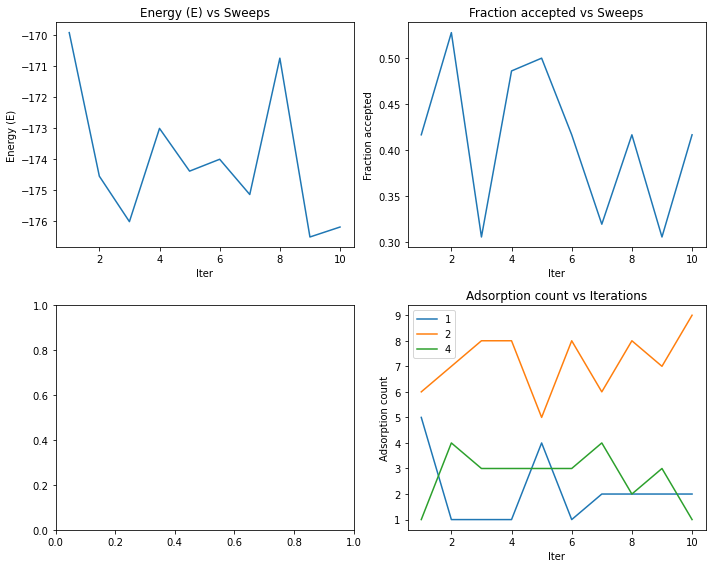

In [18]:
import matplotlib.pyplot as plt
runs = range(1, num_runs+1)

# do the plots
fig, ax = plt.subplots(2, 2, figsize=(10, 8))
ax[0, 0].plot(runs, energy_hist)
ax[0, 0].set_xlabel("Iter")
ax[0, 0].set_ylabel("Energy (E)")
ax[0, 0].set_title("Energy (E) vs Sweeps")

ax[0, 1].plot(runs, frac_accept_hist)
ax[0, 1].set_xlabel("Iter")
ax[0, 1].set_ylabel("Fraction accepted")
ax[0, 1].set_title("Fraction accepted vs Sweeps")

ax[1, 1].plot(runs, np.array(list(adsorption_count_hist.values())).T)
ax[1, 1].set_xlabel("Iter")
ax[1, 1].set_ylabel("Adsorption count")
ax[1, 1].legend(adsorption_count_hist.keys())
ax[1, 1].set_title("Adsorption count vs Iterations")

fig.show()
fig.tight_layout()

OK, Forget about all of these!! Use a 3x3 unit cell!

In [71]:
# but why not rotate the slab instead
import math
rot_matrix = np.array([
    [math.sqrt(3)/2, -1/2, 0],
    [1/2, math.sqrt(3)/2, 0],
    [0, 0, 1]
    ]) 
rot_slab = make_supercell(slab, rot_matrix, wrap=False, tol=1e-4)
# rot_supercell.write("GaN_hexagonal_rot_sqrt3xsqrt3.cif")
# rot_slab, surface_atoms = surfaces.surface_from_bulk(rot_supercell, [0,0,0,1], size=[4,4], vacuum=10)
# slab.write('GaN_0001_2x2_pristine_slab.cif')
rot_slab.write('GaN_0001_rot_4x4_pristine_slab.cif')

In [88]:
# rotating the unit cell
import math
rot_matrix = np.array([
    [math.sqrt(3)/2, -1/2, 0],
    [1/2, math.sqrt(3)/2, 0],
    [0, 0, 1]
    ]) 
id_matrix = np.array([
    [1, 0, 0],
    [0, 1, 0],
    [0, 0, 1]
    ]) 
int_trans_matrix = np.array([
    [5, 0, 0],
    [0, 5, 0],
    [0, 0, 1]
    ]) 
rot_cell = make_supercell(atoms, rot_matrix, wrap=True, tol=1e-4)
rot_cell.write("GaN_hexagonal_rot_sqrt3xsqrt3.cif")
# manually edit the lattice parameters before loading

rot_cell = read("GaN_hexagonal_rot_sqrt3xsqrt3_lattice_edited.cif")
rot_supercell = rot_cell*(4,4,4)
rot_supercell.write("GaN_hexagonal_rot_sqrt3xsqrt3_4x4.cif")

# manually edit the lattice parameters before loading
# well, no need to manually edit after editing the primitive unit cell
# rot_supercell = read("GaN_hexagonal_rot_sqrt3xsqrt3_4x4_lattice_edited.cif")
rot_slab, surface_atoms = surfaces.surface_from_bulk(rot_supercell, [0,0,0,1], size=[4,4], vacuum=10)
# slab.write('GaN_0001_2x2_pristine_slab.cif')
rot_slab.write('GaN_0001_rot_4x4_pristine_slab.cif')

In [90]:
# rotate the supercell instead
supercell_atoms = atoms*(4,4,4)
supercell_atoms.write('GaN_hexagonal_4x4.cif')

rot_supercell = make_supercell(supercell_atoms, rot_matrix, wrap=True, tol=1e-4)
rot_supercell.write("GaN_hexagonal_rot_from_supcell_sqrt3xsqrt3_4x4.cif")
# manually edit the lattice parameters before loading
rot_supercell = read("GaN_hexagonal_rot_from_supcell_sqrt3xsqrt3_4x4_lattice_edited.cif")
rot_supercell.write("GaN_hexagonal_rot_sqrt3xsqrt3_4x4.cif")

rot_slab, surface_atoms = surfaces.surface_from_bulk(rot_supercell, [0,0,0,1], size=[4,4], vacuum=10)
# slab.write('GaN_0001_2x2_pristine_slab.cif')
rot_slab.write('GaN_0001_rot_4x4_pristine_slab.cif')
# EVEN MORE MESSED UP!

In [9]:
from time import perf_counter

chem_pots = np.linspace(-4, 0, 5)
# chem_pots = [0] # do just one

element = 'Si'
ads = catkit.gratoms.Gratoms(element)

num_runs = 100
all_energy_hist = np.random.rand(len(chem_pots), num_runs)
all_frac_accept_hist = np.random.rand(len(chem_pots), num_runs)
all_top_count_hist = np.random.rand(len(chem_pots), num_runs)
all_bridge_count_hist = np.random.rand(len(chem_pots), num_runs)
all_hollow_count_hist = np.random.rand(len(chem_pots), num_runs)

for i, chem_pot in enumerate(chem_pots):
    start = perf_counter()
    slab, surface_atoms = surfaces.surface_from_bulk(atoms, [1,0,0], size=[4,4])
    history, energy_hist, frac_accept_hist, adsorption_count_hist = mcmc_run(num_runs=num_runs, temp=1, pot=chem_pot, alpha=1, slab=slab, calc=lammps_calc, element=element)
    stop = perf_counter()
    print(f"Time taken = {stop - start} seconds")
    all_energy_hist[i] = energy_hist
    all_frac_accept_hist[i] = frac_accept_hist
    all_top_count_hist[i] = adsorption_count_hist[1]
    all_bridge_count_hist[i] = adsorption_count_hist[2]
    all_hollow_count_hist[i] = adsorption_count_hist[4]

/home/dux/.local/lib/python3.9/site-packages/catkit/gen/surface.py:334: UserWarning: Your slab has no bulk atoms and may be too thin to identify surface atoms correctly. This may cause surface adsorption site identification to fail.
  warnings.warn(
INFO:Running with num_runs = 100, temp = 1, pot = -4.0, alpha = 1
/home/dux/.local/lib/python3.9/site-packages/catkit/gen/adsorption.py:60: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.r1_topology = np.array(self.r1_topology)
/home/dux/.local/lib/python3.9/site-packages/catkit/gen/adsorption.py:61: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specif

there are 64 atoms 
using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f05d3ad3130>


INFO:In pristine slab, there are a total of 128 sites
/home/dux/miniconda3/envs/mlenv/lib/python3.9/site-packages/ase/calculators/lammpsrun.py:379: UserWarning: semi-periodic ASE cell detected - translation to proper LAMMPS input cell might fail
  warnings.warn(
INFO:running for 128 iterations per run over a total of 100 runs
INFO:adsorbate is Si
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24

Time taken = 154.34343207790516 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.0, alpha = 1


there are 64 atoms 
using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f05d3ad3130>


INFO:In pristine slab, there are a total of 128 sites
INFO:running for 128 iterations per run over a total of 100 runs
INFO:adsorbate is Si
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
I

Time taken = 157.36120266700163 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -2.0, alpha = 1


there are 64 atoms 
using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f05d3ad3130>


INFO:In pristine slab, there are a total of 128 sites
INFO:running for 128 iterations per run over a total of 100 runs
INFO:adsorbate is Si
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
I

Time taken = 165.0352555778809 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -1.0, alpha = 1


there are 64 atoms 
using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f05d3ad3130>


INFO:In pristine slab, there are a total of 128 sites
INFO:running for 128 iterations per run over a total of 100 runs
INFO:adsorbate is Si
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
I

Time taken = 165.50997584802099 seconds


INFO:Running with num_runs = 100, temp = 1, pot = 0.0, alpha = 1


there are 64 atoms 
using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f05d3ad3130>


INFO:In pristine slab, there are a total of 128 sites
INFO:running for 128 iterations per run over a total of 100 runs
INFO:adsorbate is Si
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
I

Time taken = 166.87562795798294 seconds


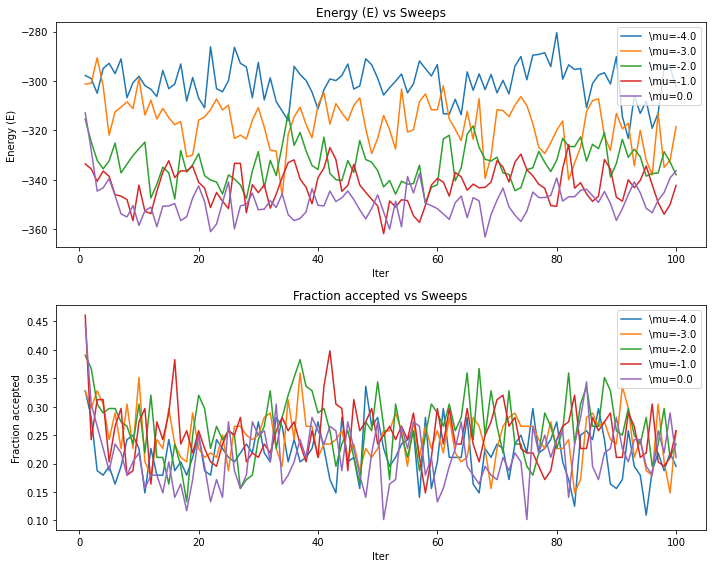

In [10]:
import matplotlib.pyplot as plt
# do the plots
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
runs = np.arange(1, num_runs+1)
legends = [f"\mu={mu}" for mu in chem_pots]
ax[0].plot(runs, all_energy_hist.T)
ax[0].set_xlabel("Iter")
ax[0].set_ylabel("Energy (E)")
ax[0].set_title("Energy (E) vs Sweeps")
ax[0].legend(legends)

ax[1].plot(runs, all_frac_accept_hist.T)
ax[1].set_xlabel("Iter")
ax[1].set_ylabel("Fraction accepted")
ax[1].set_title("Fraction accepted vs Sweeps")
ax[1].legend(legends)

fig.tight_layout()
fig.show()
# fig.savefig("energy_per_spin")
# fig.savefig("sgmc_anneal_alpha_0.9_repeat1.png")

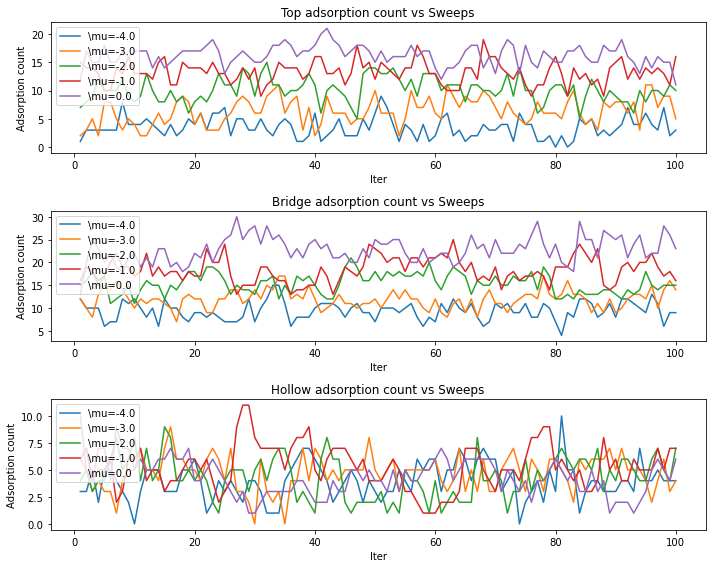

In [11]:
import matplotlib.pyplot as plt

# do the plots
fig, ax = plt.subplots(3, 1, figsize=(10, 8))
runs = np.arange(1, num_runs+1)
legends = [f"\mu={mu}" for mu in chem_pots]

ax[0].plot(runs, all_top_count_hist.T)
ax[0].set_xlabel("Iter")
ax[0].set_ylabel("Adsorption count")
ax[0].set_title("Top adsorption count vs Sweeps")
ax[0].legend(legends)

ax[1].plot(runs, all_bridge_count_hist.T)
ax[1].set_xlabel("Iter")
ax[1].set_ylabel("Adsorption count")
ax[1].set_title("Bridge adsorption count vs Sweeps")
ax[1].legend(legends)

ax[2].plot(runs, all_hollow_count_hist.T)
ax[2].set_xlabel("Iter")
ax[2].set_ylabel("Adsorption count")
ax[2].set_title("Hollow adsorption count vs Sweeps")
ax[2].legend(legends)

fig.show()
fig.tight_layout()

Fine grain work

In [23]:
from time import perf_counter

chem_pots = np.linspace(-4.0, -3.75, 10)
# chem_pots = [0] # do just one

# use LAMMPS
parameters = {
    'pair_style': 'eam',
    'pair_coeff': ['* * Au_u3.eam']
}

potential_file = os.path.join(os.environ["LAMMPS_POTENTIALS"], 'Au_u3.eam')
lammps_calc = LAMMPS(files=[potential_file], keep_tmp_files=False, keep_alive=False, tmp_dir="/home/dux/surface_sampling/tmp_files")
lammps_calc.set(**parameters)

# Au from standard cell
atoms = read('Au_mp-81_conventional_standard.cif')
slab, surface_atoms = surfaces.surface_from_bulk(atoms, [1,1,0], size=[4,4])
slab.write('Au_110_pristine_slab.cif')

slab.calc = lammps_calc

num_runs = 100
all_energy_hist = np.random.rand(len(chem_pots), num_runs)
all_frac_accept_hist = np.random.rand(len(chem_pots), num_runs)
all_top_count_hist = np.random.rand(len(chem_pots), num_runs)
all_bridge_count_hist = np.random.rand(len(chem_pots), num_runs)
all_hollow_count_hist = np.random.rand(len(chem_pots), num_runs)

element = 'Au'

for i, chem_pot in enumerate(chem_pots):
    start = perf_counter()
    # reset every 8 iter
    slab, surface_atoms = surfaces.surface_from_bulk(atoms, [1,1,0], size=[4,4])

    history, energy_hist, frac_accept_hist, adsorption_count_hist = mcmc_run(num_runs=num_runs, temp=1, pot=chem_pot, alpha=0.98, slab=slab, calc=lammps_calc, element=element)
    stop = perf_counter()
    print(f"Time taken = {stop - start} seconds")
    all_energy_hist[i] = energy_hist
    all_frac_accept_hist[i] = frac_accept_hist
    all_top_count_hist[i] = adsorption_count_hist[1]
    all_bridge_count_hist[i] = adsorption_count_hist[2]
    all_hollow_count_hist[i] = adsorption_count_hist[4]

/home/dux/miniconda3/envs/mlenv/lib/python3.9/site-packages/catkit/gen/surface.py:334: UserWarning: Your slab has no bulk atoms and may be too thin to identify surface atoms correctly. This may cause surface adsorption site identification to fail.
  warnings.warn(
INFO:Running with num_runs = 100, temp = 1, pot = -4.0, alpha = 0.98
/home/dux/miniconda3/envs/mlenv/lib/python3.9/site-packages/catkit/gen/adsorption.py:60: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.r1_topology = np.array(self.r1_topology)
/home/dux/miniconda3/envs/mlenv/lib/python3.9/site-packages/catkit/gen/adsorption.py:61: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is depr

using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
/home/dux/miniconda3/envs/mlenv/lib/python3.9/site-packages/ase/calculators/lammpsrun.py:379: UserWarning: semi-periodic ASE cell detected - translation to proper LAMMPS input cell might fail
  warnings.warn(
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In s

Time taken = 251.78863098472357 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.9722222222222223, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 249.44283860176802 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.9444444444444446, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 347.56754648685455 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.9166666666666665, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 384.42916913330555 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.888888888888889, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 292.34986739605665 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.861111111111111, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 248.51398096978664 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.8333333333333335, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 256.4304554462433 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.8055555555555554, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 255.38466969877481 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.7777777777777777, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 256.46831335127354 seconds


INFO:Running with num_runs = 100, temp = 1, pot = -3.75, alpha = 0.98


using slab calc <ase.calculators.lammpsrun.LAMMPS object at 0x7f9b88165820>


INFO:In pristine slab, there are a total of 192 sites
INFO:running for 192 iterations per run over a total of 100 runs
INFO:In sweep 1 out of 100
INFO:In sweep 2 out of 100
INFO:In sweep 3 out of 100
INFO:In sweep 4 out of 100
INFO:In sweep 5 out of 100
INFO:In sweep 6 out of 100
INFO:In sweep 7 out of 100
INFO:In sweep 8 out of 100
INFO:In sweep 9 out of 100
INFO:In sweep 10 out of 100
INFO:In sweep 11 out of 100
INFO:In sweep 12 out of 100
INFO:In sweep 13 out of 100
INFO:In sweep 14 out of 100
INFO:In sweep 15 out of 100
INFO:In sweep 16 out of 100
INFO:In sweep 17 out of 100
INFO:In sweep 18 out of 100
INFO:In sweep 19 out of 100
INFO:In sweep 20 out of 100
INFO:In sweep 21 out of 100
INFO:In sweep 22 out of 100
INFO:In sweep 23 out of 100
INFO:In sweep 24 out of 100
INFO:In sweep 25 out of 100
INFO:In sweep 26 out of 100
INFO:In sweep 27 out of 100
INFO:In sweep 28 out of 100
INFO:In sweep 29 out of 100
INFO:In sweep 30 out of 100
INFO:In sweep 31 out of 100
INFO:In sweep 32 out o

Time taken = 254.23751682043076 seconds


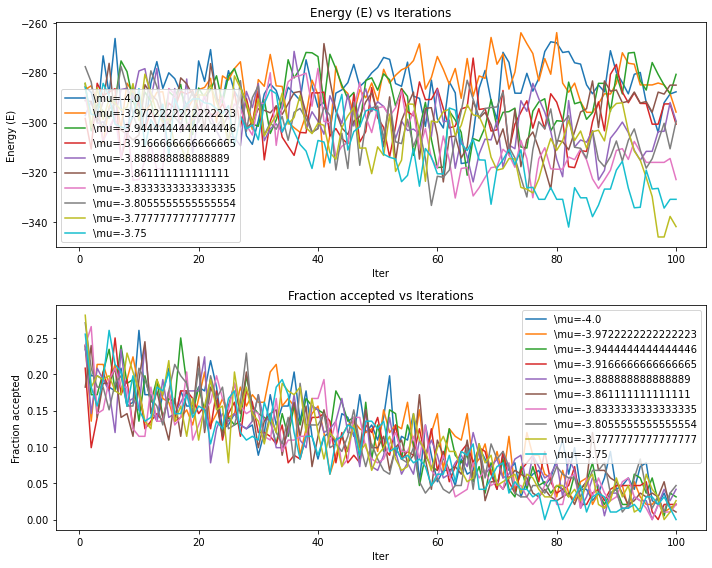

In [24]:
import matplotlib.pyplot as plt
# do the plots
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
runs = np.arange(1, num_runs+1)
legends = [f"\mu={mu}" for mu in chem_pots]
ax[0].plot(runs, all_energy_hist.T)
ax[0].set_xlabel("Iter")
ax[0].set_ylabel("Energy (E)")
ax[0].set_title("Energy (E) vs Iterations")
ax[0].legend(legends)

ax[1].plot(runs, all_frac_accept_hist.T)
ax[1].set_xlabel("Iter")
ax[1].set_ylabel("Fraction accepted")
ax[1].set_title("Fraction accepted vs Iterations")
ax[1].legend(legends)

fig.show()
fig.tight_layout()
# fig.savefig("energy_per_spin")
# fig.savefig("sgmc_anneal_alpha_0.9_repeat1.png")

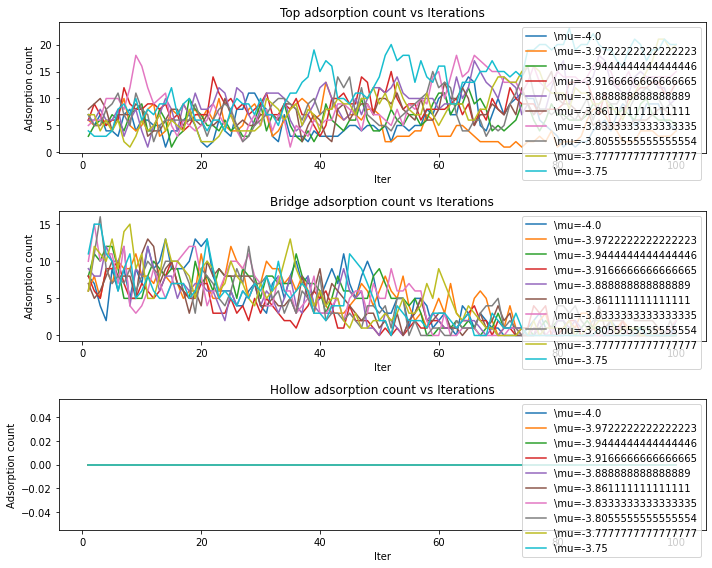

In [25]:
import matplotlib.pyplot as plt

# do the plots
fig, ax = plt.subplots(3, 1, figsize=(10, 8))
runs = np.arange(1, num_runs+1)
legends = [f"\mu={mu}" for mu in chem_pots]

ax[0].plot(runs, all_top_count_hist.T)
ax[0].set_xlabel("Iter")
ax[0].set_ylabel("Adsorption count")
ax[0].set_title("Top adsorption count vs Iterations")
ax[0].legend(legends)

ax[1].plot(runs, all_bridge_count_hist.T)
ax[1].set_xlabel("Iter")
ax[1].set_ylabel("Adsorption count")
ax[1].set_title("Bridge adsorption count vs Iterations")
ax[1].legend(legends)

ax[2].plot(runs, all_hollow_count_hist.T)
ax[2].set_xlabel("Iter")
ax[2].set_ylabel("Adsorption count")
ax[2].set_title("Hollow adsorption count vs Iterations")
ax[2].legend(legends)

fig.show()
fig.tight_layout()